In [59]:
import pandas as pd
import numpy as np
import seaborn as sns 
import matplotlib.pyplot as plt
import plotly.express as px
pd.options.display.float_format = '{:,.2f}'.format  

In [60]:
df=pd.read_csv("Loan approval prediction.csv")

In [61]:
df

,id,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length,loan_status
0,0,37,35000,RENT,0.00,EDUCATION,B,6000,11.49,0.17,N,14,0
1,1,22,56000,OWN,6.00,MEDICAL,C,4000,13.35,0.07,N,2,0
2,2,29,28800,OWN,8.00,PERSONAL,A,6000,8.90,0.21,N,10,0
3,3,30,70000,RENT,14.00,VENTURE,B,12000,11.11,0.17,N,5,0
4,4,22,60000,RENT,2.00,MEDICAL,A,6000,6.92,0.10,N,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
58640,58640,34,120000,MORTGAGE,5.00,EDUCATION,D,25000,15.95,0.21,Y,10,0
58641,58641,28,28800,RENT,0.00,MEDICAL,C,10000,12.73,0.35,N,8,1
58642,58642,23,44000,RENT,7.00,EDUCATION,D,6800,16.00,0.15,N,2,1
58643,58643,22,30000,RENT,2.00,EDUCATION,A,5000,8.90,0.17,N,3,0


In [62]:
df.describe()

,id,person_age,person_income,person_emp_length,loan_amnt,loan_int_rate,loan_percent_income,cb_person_cred_hist_length,loan_status
count,"58,645.00","58,645.00","58,645.00","58,645.00","58,645.00","58,645.00","58,645.00","58,645.00","58,645.00"
mean,"29,322.00",27.55,"64,046.17",4.70,"9,217.56",10.68,0.16,5.81,0.14
std,"16,929.50",6.03,"37,931.11",3.96,"5,563.81",3.03,0.09,4.03,0.35
min,0.00,20.00,"4,200.00",0.00,500.00,5.42,0.00,2.00,0.00
25%,"14,661.00",23.00,"42,000.00",2.00,"5,000.00",7.88,0.09,3.00,0.00
50%,"29,322.00",26.00,"58,000.00",4.00,"8,000.00",10.75,0.14,4.00,0.00
75%,"43,983.00",30.00,"75,600.00",7.00,"12,000.00",12.99,0.21,8.00,0.00
max,"58,644.00",123.00,"1,900,000.00",123.00,"35,000.00",23.22,0.83,30.00,1.00


In [63]:
df.describe(include='object')

,person_home_ownership,loan_intent,loan_grade,cb_person_default_on_file
count,58645,58645,58645,58645
unique,4,6,7,2
top,RENT,EDUCATION,A,N
freq,30594,12271,20984,49943



# Data Cleaning

## Check Missing Values and Meta Data

In [64]:
df.isna().sum()

id                            0
person_age                    0
person_income                 0
person_home_ownership         0
person_emp_length             0
loan_intent                   0
loan_grade                    0
loan_amnt                     0
loan_int_rate                 0
loan_percent_income           0
cb_person_default_on_file     0
cb_person_cred_hist_length    0
loan_status                   0
dtype: int64

In [65]:
df = df.drop(columns=['id'])

In [66]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 58645 entries, 0 to 58644
Data columns (total 12 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   person_age                  58645 non-null  int64  
 1   person_income               58645 non-null  int64  
 2   person_home_ownership       58645 non-null  object 
 3   person_emp_length           58645 non-null  float64
 4   loan_intent                 58645 non-null  object 
 5   loan_grade                  58645 non-null  object 
 6   loan_amnt                   58645 non-null  int64  
 7   loan_int_rate               58645 non-null  float64
 8   loan_percent_income         58645 non-null  float64
 9   cb_person_default_on_file   58645 non-null  object 
 10  cb_person_cred_hist_length  58645 non-null  int64  
 11  loan_status                 58645 non-null  int64  
dtypes: float64(3), int64(5), object(4)
memory usage: 5.4+ MB


## Handeling Outliers

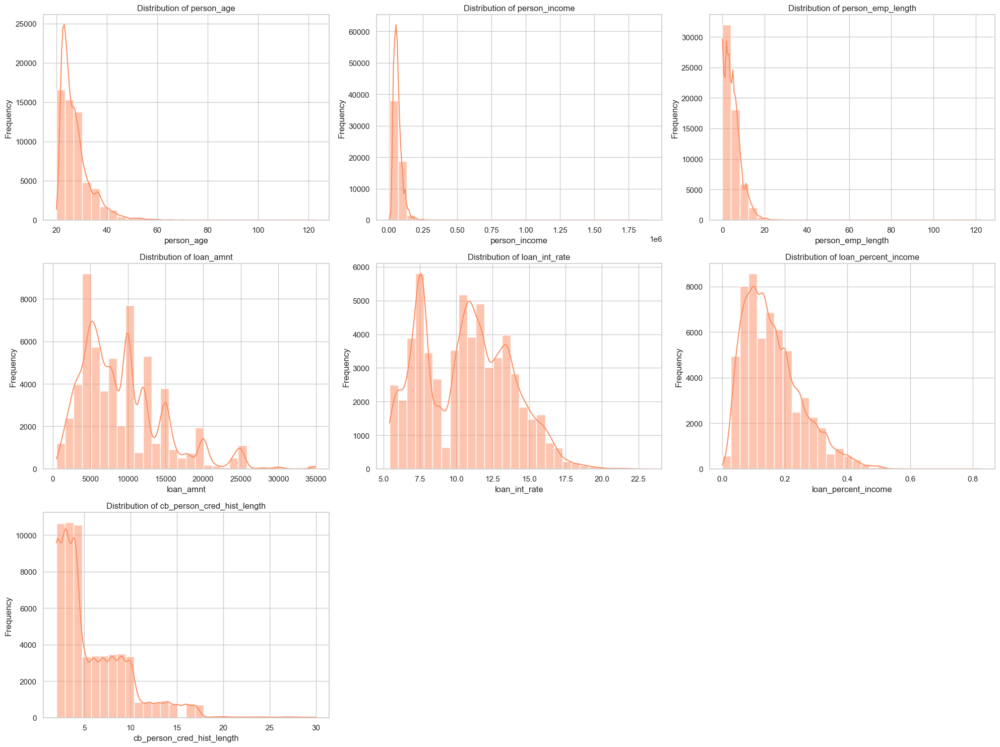

In [67]:
# Set the style
sns.set(style="whitegrid")

# Numerical columns to analyze
numerical_columns = [
    "person_age",
    "person_income",
    "person_emp_length",
    "loan_amnt",
    "loan_int_rate",
    "loan_percent_income",
    "cb_person_cred_hist_length",
]

# Set a single color from the Set2 palette
color = sns.color_palette("Set2")[1]  # Choose the first color in the Set2 palette

# Plot distributions of numerical features
plt.figure(figsize=(20, 15))
for i, col in enumerate(numerical_columns, 1):
    plt.subplot(3, 3, i)
    sns.histplot(df[col], kde=True, bins=30, color=color)  # Use the same color for all
    plt.title(f"Distribution of {col}")
    plt.xlabel(col)
    plt.ylabel("Frequency")

# Adjust layout and show the plot
plt.tight_layout()
plt.show()


In [68]:
# Select only numeric columns
numeric_cols = df.select_dtypes(include=['number']).columns

# Define the color from Set2 palette (qualitative)
color = px.colors.qualitative.Set2[1]  # Choose the first color from the Set2 palette

# Create interactive box plots for each numeric column
for col in numeric_cols:
    fig = px.box(
        df,
        x=col,  # Horizontal box plot
        title=f'Interactive Box Plot for {col}',
        template="plotly_white",
    )
    fig.update_traces(marker=dict(color=color))  # Set the box color to the chosen color
    fig.update_layout(
        xaxis_title=col,
        yaxis_title="Values",
    )
    fig.show()

In [69]:
df_age_above_45= df[df['person_age']<=45]
filtered_age_income=df_age_above_45[(df_age_above_45['person_income'] <= 150000)]
filtered_df = filtered_age_income[(filtered_age_income['person_emp_length']<= 15)]
df = filtered_df[filtered_df['loan_amnt']<=25000]

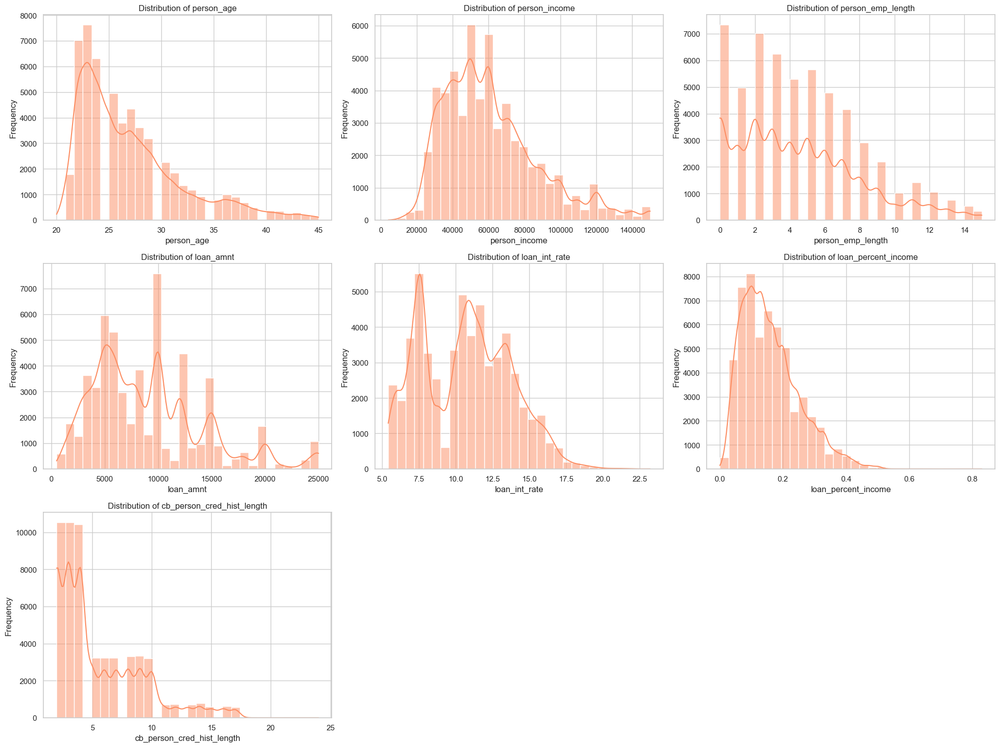

In [70]:
# Set the style
sns.set(style="whitegrid")

# Numerical columns to analyze
numerical_columns = [
    "person_age",
    "person_income",
    "person_emp_length",
    "loan_amnt",
    "loan_int_rate",
    "loan_percent_income",
    "cb_person_cred_hist_length",
]

# Set a single color from the Set2 palette
color = sns.color_palette("Set2")[1]  # Choose the first color in the Set2 palette

# Plot distributions of numerical features
plt.figure(figsize=(20, 15))
for i, col in enumerate(numerical_columns, 1):
    plt.subplot(3, 3, i)
    sns.histplot(df[col], kde=True, bins=30, color=color)  # Use the same color for all
    plt.title(f"Distribution of {col}")
    plt.xlabel(col)
    plt.ylabel("Frequency")

# Adjust layout and show the plot
plt.tight_layout()
plt.show()


## Feature Engineering

In [72]:
# Add column to make EDA more easier
df['Age Level'] = pd.cut(
    df['person_age'],
    bins=[19, 25, 35, 46],  # Define the bins
    labels=['(20-24)', '(25-34)', '(35-46)'],  # Define the labels for each bin
    right=True  # Include the rightmost edge of the interval
)

C:\Users\DANTECH\AppData\Local\Temp\ipykernel_12216\45004633.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



## Handling Categorical Columns

In [74]:
loan_grade_mapping = {
    'A': 'Excellent',
    'B': 'Very Good',
    'C': 'Good',
    'D': 'Fair',
    'E': 'Poor',
    'F': 'Very Poor',
    'G': 'Default'
}

# Replace the values in the 'loan_grade' column with their real names
df['loan_grade'] = df['loan_grade'].replace(loan_grade_mapping)


C:\Users\DANTECH\AppData\Local\Temp\ipykernel_12216\459469547.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [75]:
df['loan_status'] = df['loan_status'].replace({0: 'Not Approved', 1: 'Approved'})


C:\Users\DANTECH\AppData\Local\Temp\ipykernel_12216\1134080932.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



# EDA :

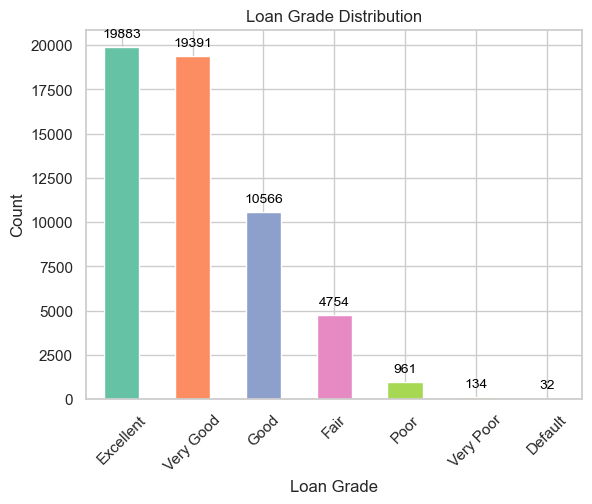

In [79]:
ax = df["loan_grade"].value_counts().plot(
    kind='bar', 
    color=sns.color_palette("Set2", n_colors=df["loan_grade"].nunique())
)

# Add labels and title for better visualization
plt.title("Loan Grade Distribution")
plt.xlabel("Loan Grade")
plt.ylabel("Count")
plt.xticks(rotation=45)

# Add annotations on top of each bar
for p in ax.patches:
    ax.annotate(
        str(p.get_height()),  # The height of the bar (count value)
        (p.get_x() + p.get_width() / 2., p.get_height()),  # x and y position
        ha='center',  # Horizontal alignment
        va='bottom',  # Vertical alignment
        fontsize=10,   # Font size
        color='black',  # Annotation text color
        xytext=(0, 5),  # Offset to prevent overlap
        textcoords="offset points"
    )

# Show the plot
plt.show()

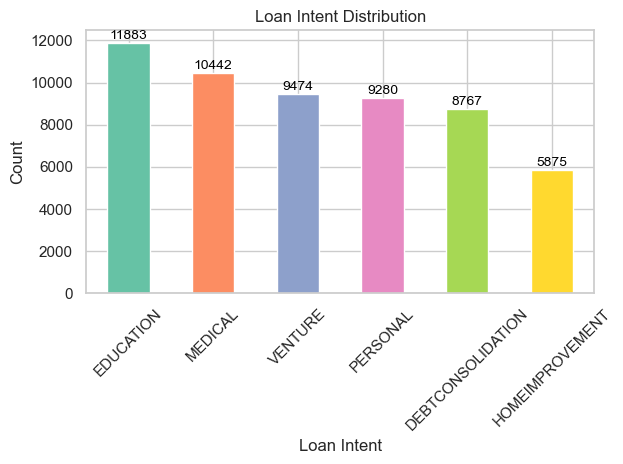

In [81]:
ax = df["loan_intent"].value_counts().plot(
    kind='bar',
    color=sns.color_palette("Set2", n_colors=len(df["loan_intent"].unique()))
)

# Add labels and title
ax.set_title("Loan Intent Distribution")
ax.set_xlabel("Loan Intent")
ax.set_ylabel("Count")

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Add labels on top of each bar
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', 
                (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='center', 
                fontsize=10, color='black', 
                xytext=(0, 5), textcoords='offset points')

# Adjust layout to prevent clipping
plt.tight_layout()

# Show the plot
plt.show()


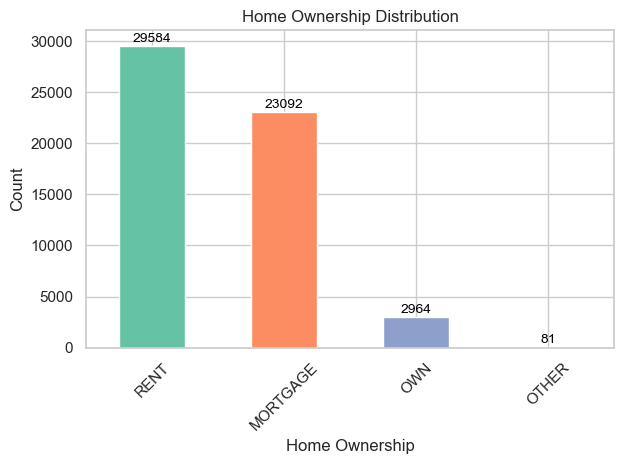

In [82]:
ax = df["person_home_ownership"].value_counts().plot(
    kind='bar',
    color=sns.color_palette("Set2", n_colors=len(df["person_home_ownership"].unique()))
)

# Add labels and title
ax.set_title("Home Ownership Distribution")
ax.set_xlabel("Home Ownership")
ax.set_ylabel("Count")

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Add labels on top of each bar
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', 
                (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='center', 
                fontsize=10, color='black', 
                xytext=(0, 5), textcoords='offset points')

# Adjust layout to prevent clipping
plt.tight_layout()

# Show the plot
plt.show()


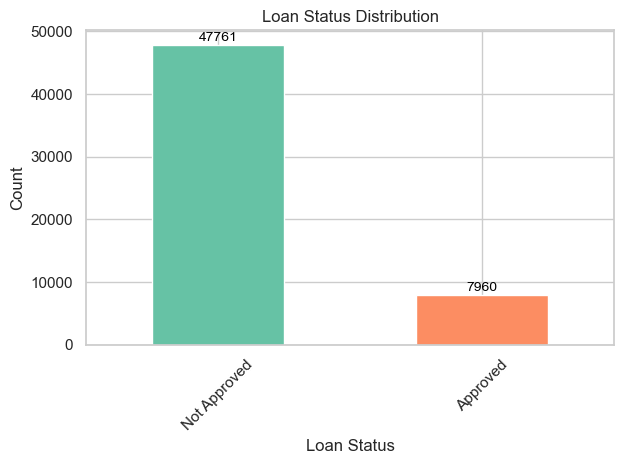

In [83]:
ax = df["loan_status"].value_counts().plot(
    kind='bar',
    color=sns.color_palette("Set2", n_colors=len(df["loan_status"].unique()))
)

# Add labels and title
ax.set_title("Loan Status Distribution")
ax.set_xlabel("Loan Status")
ax.set_ylabel("Count")

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Add labels on top of each bar
for p in ax.patches:
    ax.annotate(f'{p.get_height()}',
                (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='center', 
                fontsize=10, color='black', 
                xytext=(0, 5), textcoords='offset points')

# Adjust layout to prevent clipping
plt.tight_layout()

# Show the plot
plt.show()


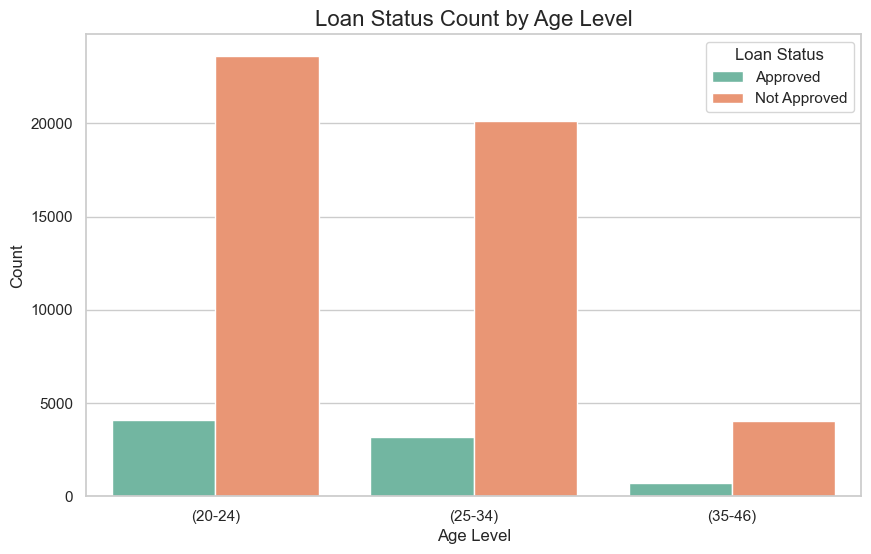

In [21]:
grouped_data = df.groupby(["Age Level", "loan_status"])["loan_status"].count().reset_index(name="count")

# Set up a bar plot to visualize the counts
plt.figure(figsize=(10, 6))
sns.barplot(data=grouped_data, x="Age Level", y="count", hue="loan_status", palette="Set2")

# Add labels and title
plt.title("Loan Status Count by Age Level", fontsize=16)
plt.xlabel("Age Level", fontsize=12)
plt.ylabel("Count", fontsize=12)
plt.legend(title="Loan Status")
plt.show()

In [22]:
df.groupby(["Age Level","loan_intent"])["loan_intent"].count().sort_values(ascending=False)

Age Level  loan_intent      
(20-24)    EDUCATION            7521
           MEDICAL              4856
           VENTURE              4852
(25-34)    MEDICAL              4660
(20-24)    DEBTCONSOLIDATION    4375
           PERSONAL             4350
(25-34)    PERSONAL             4057
           VENTURE              3820
           DEBTCONSOLIDATION    3742
           EDUCATION            3608
           HOMEIMPROVEMENT      3424
(20-24)    HOMEIMPROVEMENT      1748
(35-46)    MEDICAL               926
           PERSONAL              873
           VENTURE               802
           EDUCATION             754
           HOMEIMPROVEMENT       703
           DEBTCONSOLIDATION     650
Name: loan_intent, dtype: int64

In [23]:
ages_level = df.groupby(['Age Level', 'loan_intent']).size().reset_index(name='count')

# Step 2: Create the bar plot
fig = px.bar(
    ages_level,
    x="Age Level",
    y="count",
    color="loan_intent",
    text="count",
    title="Loan Intent Distribution Across Age Levels",
    labels={"count": "Loan Intent Count", "loan_intent": "Loan Intent"},
    barmode="group",  # Use 'stack' for a stacked bar chart
    hover_name="loan_intent",
    color_discrete_sequence=px.colors.qualitative.Set2  # Set2 palette in Plotly
)

# Step 3: Show the plot
fig.show()

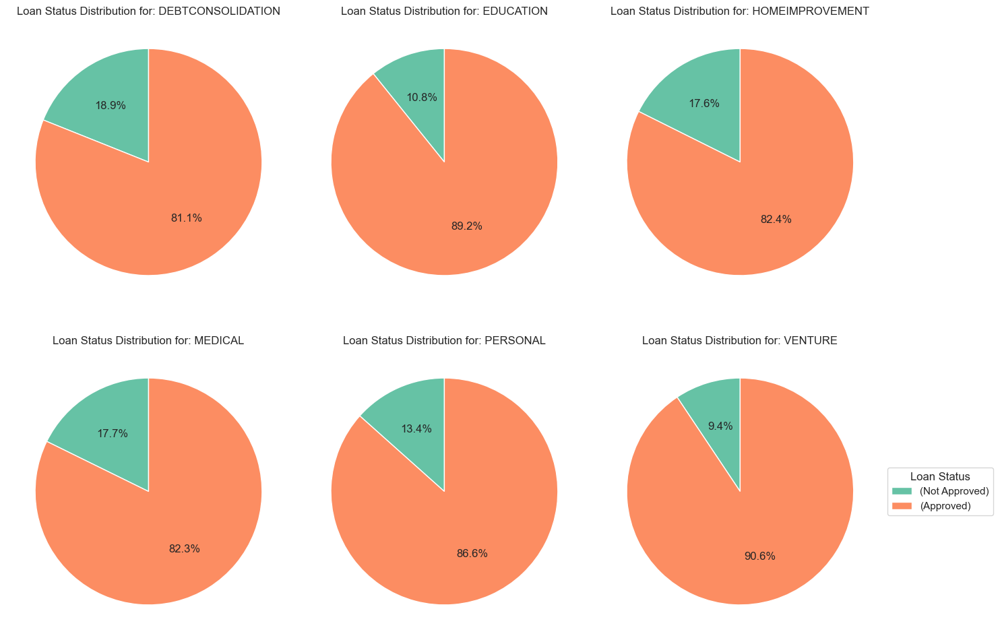

In [24]:
percentages = df.groupby(["loan_intent", "loan_status"])["loan_status"] \
    .count() \
    .groupby(level=0) \
    .apply(lambda x: 100 * x / x.sum())

loan_intents = percentages.index.get_level_values(0).unique()

# Define the number of rows and columns for subplots
n_cols = 3  # Number of columns in the grid
n_rows = (len(loan_intents) + n_cols - 1) // n_cols  # Number of rows required to fit all charts

# Create a figure and subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5 * n_rows))  # Adjust figsize for multiple charts

# Flatten axes for easy iteration if the grid has more than one row
axes = axes.flatten()

# Define the color mapping for loan statuses using Set2 palette
status_colors = sns.color_palette("Set2", 2)  # Set2 palette for 2 categories
status_labels = ["(Not Approved)", "(Approved)"]  # Legend labels for loan statuses

# Loop through each unique loan_intent and plot the pie chart for its loan status distribution
for i, intent in enumerate(loan_intents):
    # Filter the percentages for the specific loan intent
    intent_percentage = percentages.xs(key=intent, level=0)
    
    # Plot a pie chart for the specific loan intent's loan status distribution
    wedges, texts, autotexts = axes[i].pie(intent_percentage, labels=None, autopct='%1.1f%%',
                                           colors=status_colors, startangle=90)
    axes[i].set_title(f"Loan Status Distribution for: {intent}")

# Add the legend to the last plot (right side of the last pie chart)
axes[-1].legend(wedges, status_labels, title="Loan Status", loc="center left", bbox_to_anchor=(1, 0.5))

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

# Adjust layout to make sure everything fits well
plt.tight_layout()
plt.show()

In [26]:
df.groupby('loan_intent')['loan_amnt'].median()

loan_intent
DEBTCONSOLIDATION   8,000.00
EDUCATION           8,000.00
HOMEIMPROVEMENT     9,500.00
MEDICAL             7,500.00
PERSONAL            8,000.00
VENTURE             8,000.00
Name: loan_amnt, dtype: float64

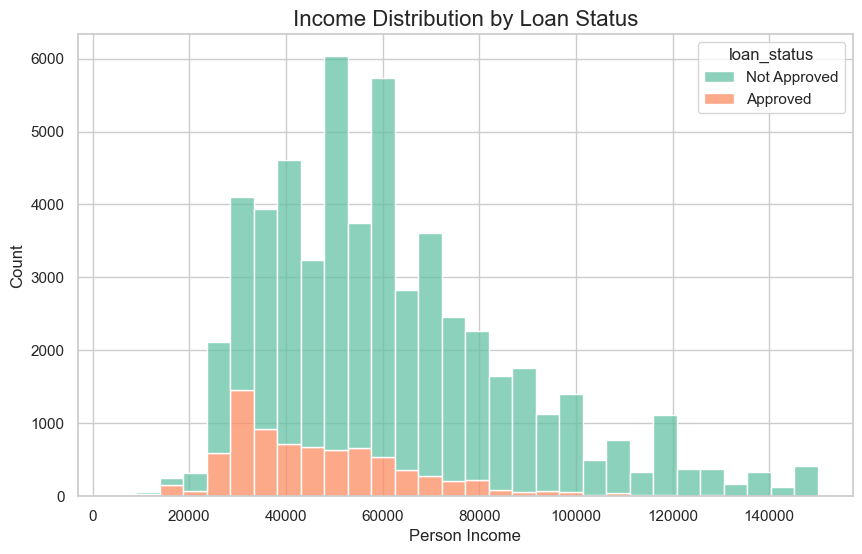

In [27]:
plt.figure(figsize=(10, 6))

# Plot histogram for person_income grouped by loan_status
sns.histplot(data=df, x="person_income", hue="loan_status", kde=False, bins=30, palette="Set2", multiple="stack")

# Add labels and title
plt.title("Income Distribution by Loan Status", fontsize=16)
plt.xlabel("Person Income", fontsize=12)
plt.ylabel("Count", fontsize=12)
plt.show()

# We can focus more on peope their income between 20000 and 60000 which more visibility to take a loan

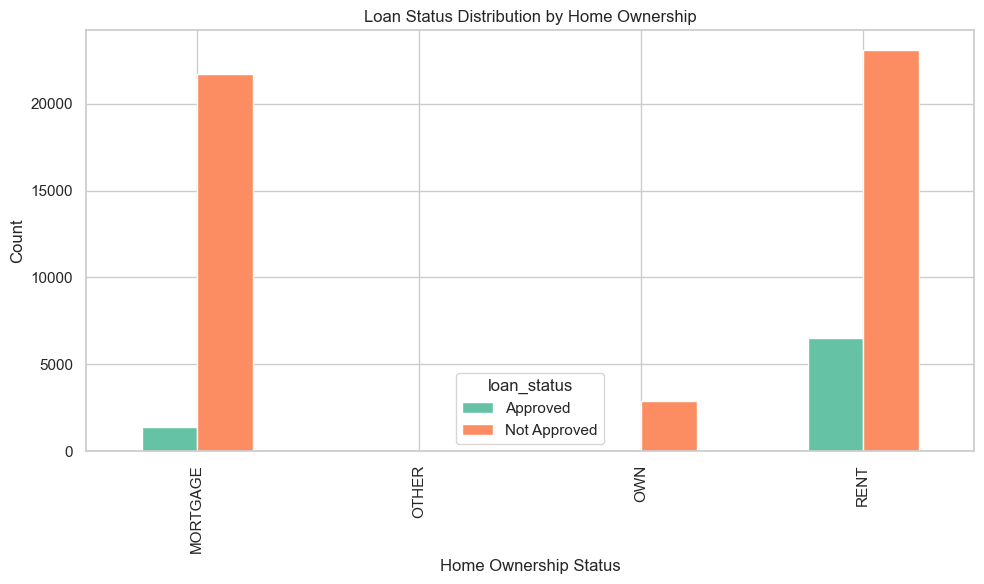

In [29]:
# Group data by home ownership and loan status, then unstack
home_ownership_loan_status = df.groupby(['person_home_ownership', 'loan_status']).size().unstack()

# Plot the grouped bar chart with Set2 palette
home_ownership_loan_status.plot(kind='bar', figsize=(10, 6), color=sns.color_palette("Set2", 2))

# Set labels and title
plt.xlabel('Home Ownership Status')
plt.ylabel('Count')
plt.title('Loan Status Distribution by Home Ownership')

# Display the chart
plt.tight_layout()
plt.show()

In [30]:
median_income_by_grade = df.groupby(['loan_grade', 'loan_intent'])['loan_amnt'].median().reset_index()

# Pivot the data to have 'loan_grade' as index and 'loan_intent' as columns
pivot_data = median_income_by_grade.pivot(index='loan_grade', columns='loan_intent', values='loan_amnt')

# Create a bar chart with Plotly, using the Set2 color palette
fig = px.bar(
    pivot_data,
    x=pivot_data.index,
    y=pivot_data.columns,
    title="Median Loan Amount by Loan Grade (Separated by Loan Intent)",
    labels={"x": "Loan Grade", "y": "Median Loan Amount"},
    color_discrete_sequence=px.colors.qualitative.Set2  # Use Set2 color palette
)

# Show the chart
fig.update_layout(barmode='group')  # Group bars together
fig.show()

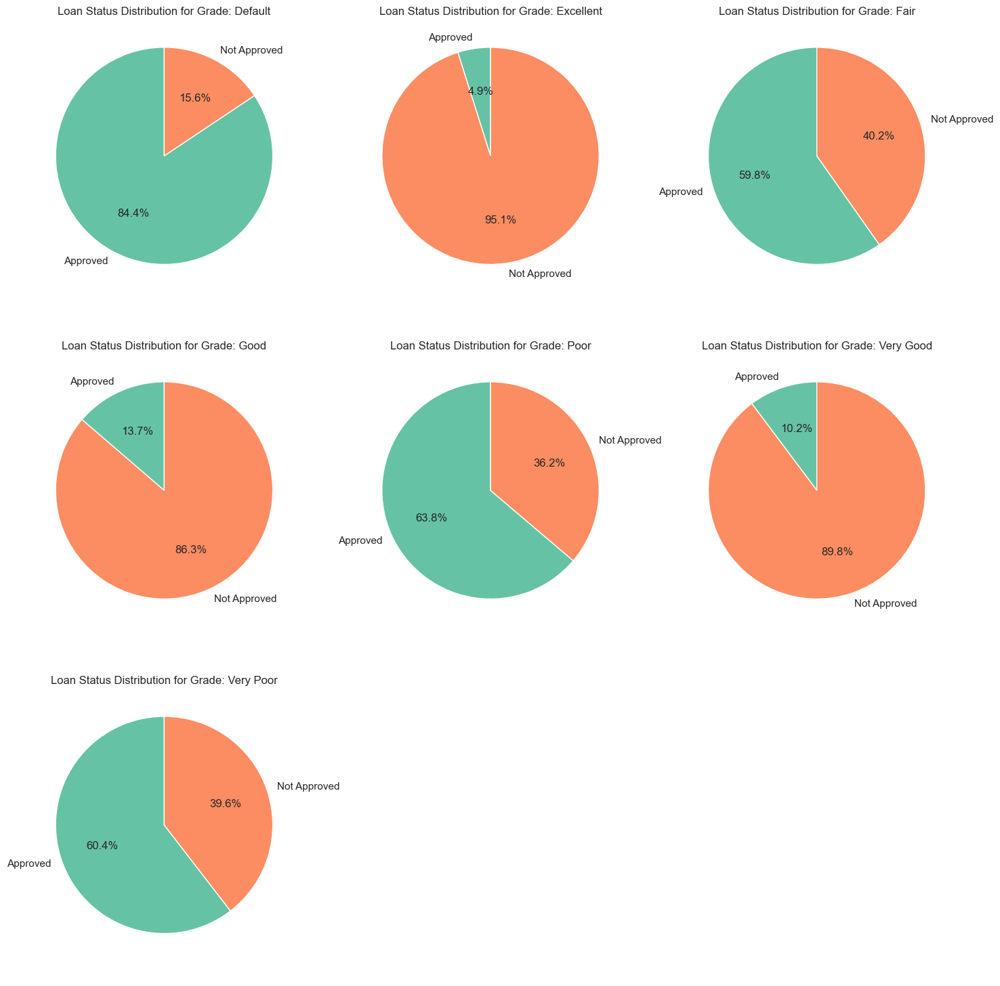

In [31]:
grouped_data = df.groupby(['loan_grade', 'loan_status'])['loan_status'].count().reset_index(name='count')

# Get unique loan grades and statuses
loan_grades = grouped_data['loan_grade'].unique()
loan_statuses = grouped_data['loan_status'].unique()

# Prepare data for plotting
data = {status: [] for status in loan_statuses}

for grade in loan_grades:
    grade_data = grouped_data[grouped_data['loan_grade'] == grade]
    for status in loan_statuses:
        count = grade_data.loc[grade_data['loan_status'] == status, 'count']
        data[status].append(count.iloc[0] if not count.empty else 0)

# Pie Chart
n_cols = 3  # Number of columns for pie charts
n_rows = (len(loan_grades) + n_cols - 1) // n_cols  # Number of rows to fit all pie charts

# Create a figure and subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5 * n_rows))  # Adjust figsize for multiple charts
axes = axes.flatten()  # Flatten axes for easy iteration

# Define color palette for loan statuses
colors = sns.color_palette("Set2", len(loan_statuses))

# Loop through each loan grade and plot a pie chart for its loan status distribution
for i, grade in enumerate(loan_grades):
    # Get the loan status distribution for the current grade
    grade_data = data
    sizes = [grade_data[status][i] for status in loan_statuses]  # Data for current grade

    # Plot pie chart for the loan grade
    axes[i].pie(sizes, labels=loan_statuses, autopct='%1.1f%%', colors=colors, startangle=90)
    axes[i].set_title(f"Loan Status Distribution for Grade: {grade}")

# Hide any unused subplots (if any)
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

# Adjust layout to ensure everything fits well
plt.tight_layout()
plt.show()

In [32]:
df.groupby(['cb_person_default_on_file','loan_status'])['loan_status'].count()

cb_person_default_on_file  loan_status 
N                          Approved         5463
                           Not Approved    41960
Y                          Approved         2497
                           Not Approved     5801
Name: loan_status, dtype: int64

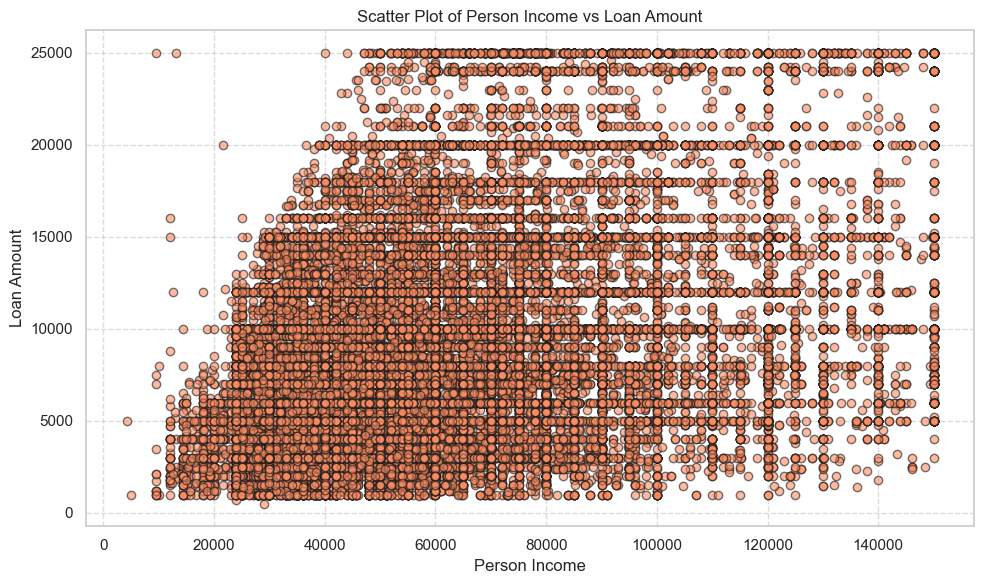

In [33]:
plt.figure(figsize=(10, 6))
plt.scatter(df['person_income'], df['loan_amnt'], alpha=0.6, edgecolor='k', color=plt.cm.Set2(1))  # Change the index for different colors

# Add labels and title
plt.title("Scatter Plot of Person Income vs Loan Amount")
plt.xlabel("Person Income")
plt.ylabel("Loan Amount")
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()

# Show the plot
plt.show()

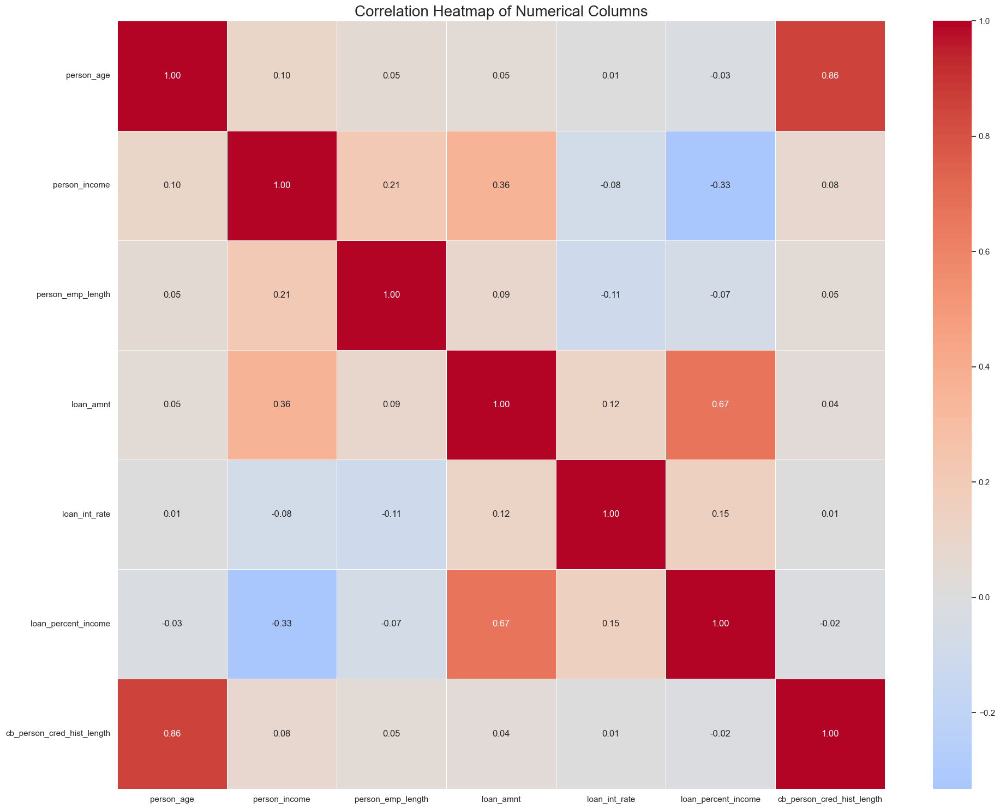

In [34]:
numerical_cols = df.select_dtypes(include=['float64', 'int64']).columns

# Compute the correlation matrix for numerical columns
corr_matrix = df[numerical_cols].corr()

# Create the heatmap
plt.figure(figsize=(20, 15))  # Set figure size for better visibility
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", linewidths=0.5, fmt=".2f", center=0)

# Add title
plt.title("Correlation Heatmap of Numerical Columns", fontsize=20)
plt.tight_layout()

# Show the plot
plt.show()

# Encode Categorical Columns

In [35]:
from sklearn.preprocessing import LabelEncoder
columns_to_encode = [
    'loan_grade',
    'loan_intent',
    'person_home_ownership',
    'cb_person_default_on_file',
    'Age Level'
]

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Apply LabelEncoder to each column in the list
for column in columns_to_encode:
    # Check if the column is not already numeric (optional check)
    if df[column].dtype == 'object' or df[column].dtype == 'category':  # Apply encoding only to non-numeric columns
        df[column] = label_encoder.fit_transform(df[column])
    else:
        print(f"Skipping encoding for {column} as it's already numeric or not categorical.")

C:\Users\DANTECH\AppData\Local\Temp\ipykernel_12216\2801628232.py:17: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\DANTECH\AppData\Local\Temp\ipykernel_12216\2801628232.py:17: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\DANTECH\AppData\Local\Temp\ipykernel_12216\2801628232.py:17: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.

# Machine Learning

In [52]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

X = df.drop('loan_status', axis=1).values
y = df['loan_status'].values 

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

## Logistic Regrission

In [53]:
from sklearn.linear_model import LogisticRegression
# Fit (train) the Logistic Regression classifier
log = LogisticRegression()
log.fit(X_train, y_train)
y_pred = log.predict(X_test)
print("Accuracy {0:.2f}%".format(100*accuracy_score(y_pred, y_test)))
cm = confusion_matrix(y_test, y_pred)
print(cm)

Accuracy 89.51%
[[ 670  928]
 [ 241 9306]]


## Random Forest

In [54]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix

# Define the Random Forest classifier with fixed hyperparameters
randforest = RandomForestClassifier()

# Train the model
randforest.fit(X_train, y_train)

# Predict with the trained model
y_pred = randforest.predict(X_test)

# Calculate and print accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy {0:.2f}%".format(100*accuracy_score(y_pred, y_test)))

# Generate and display the confusion matrix
cm = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(cm)


Accuracy 94.98%
Confusion Matrix:
[[1124  474]
 [  86 9461]]


In [55]:
report = classification_report(y_test, y_pred)
print("Classification Report:")
print(report)

Classification Report:
              precision    recall  f1-score   support

    Approved       0.93      0.70      0.80      1598
Not Approved       0.95      0.99      0.97      9547

    accuracy                           0.95     11145
   macro avg       0.94      0.85      0.89     11145
weighted avg       0.95      0.95      0.95     11145



## KNN

In [56]:
from sklearn.neighbors import KNeighborsClassifier

# Fit (train) the KNN classifier
knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(X_train, y_train)
y_predict = knn.predict(X_test)
print("Accuracy {0:.2f}%".format(100*accuracy_score(y_pred, y_test)))
cm = confusion_matrix(y_test, y_pred)
report = classification_report(y_test, y_pred)
print("Classification Report:")
print(report)

Accuracy 94.98%
Classification Report:
              precision    recall  f1-score   support

    Approved       0.93      0.70      0.80      1598
Not Approved       0.95      0.99      0.97      9547

    accuracy                           0.95     11145
   macro avg       0.94      0.85      0.89     11145
weighted avg       0.95      0.95      0.95     11145



## SVC

In [57]:
from sklearn.svm import SVC

# Fit (train) the Support Vector Machine classifier
svm = SVC()
svm.fit(X_train, y_train)
y_predict = svm.predict(X_test)
print("Accuracy {0:.2f}%".format(100*accuracy_score(y_pred, y_test)))
cm = confusion_matrix(y_test, y_pred)
report = classification_report(y_test, y_pred)
print("Classification Report:")
print(report)

Accuracy 94.98%
Classification Report:
              precision    recall  f1-score   support

    Approved       0.93      0.70      0.80      1598
Not Approved       0.95      0.99      0.97      9547

    accuracy                           0.95     11145
   macro avg       0.94      0.85      0.89     11145
weighted avg       0.95      0.95      0.95     11145



In [58]:
report = classification_report(y_test, y_pred, output_dict=True)

# Convert the classification report to a DataFrame
report_df = pd.DataFrame(report).transpose()
report_df

,precision,recall,f1-score,support
Approved,0.93,0.70,0.80,"1,598.00"
Not Approved,0.95,0.99,0.97,"9,547.00"
accuracy,0.95,0.95,0.95,0.95
macro avg,0.94,0.85,0.89,"11,145.00"
weighted avg,0.95,0.95,0.95,"11,145.00"


# Thank You